In [34]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde
from scipy import stats
import matplotlib.font_manager as fm
from matplotlib.font_manager import FontProperties


In [4]:
nba_data = pd.read_csv('DB-NBA-cleaned.csv', sep=',', comment='#')

nba_df = pd.DataFrame(nba_data)

Paleta de colores

In [5]:
colores = {0: '#C8102E', 1: '#1D428A'}

## Shot Distribution

To start the analysis, we began to focus on how the different shots are distributed throught the basketball to find trends and patters that can give us insights on strategies to follow

We perform a brief exploration of the data after data cleaning. The following chart shows the distribution of the most frequent shots in the dataset.

In [7]:
nba_df['SEASON_2'].unique()

season_23_24 = nba_df[nba_df['SEASON_2'] == '2023-24']
season_22_23 = nba_df[nba_df['SEASON_2'] == '2022-23']
season_21_22 = nba_df[nba_df['SEASON_2'] == '2021-22']
season_20_21 = nba_df[nba_df['SEASON_2'] == '2020-21']
season_19_20 = nba_df[nba_df['SEASON_2'] == '2019-20']

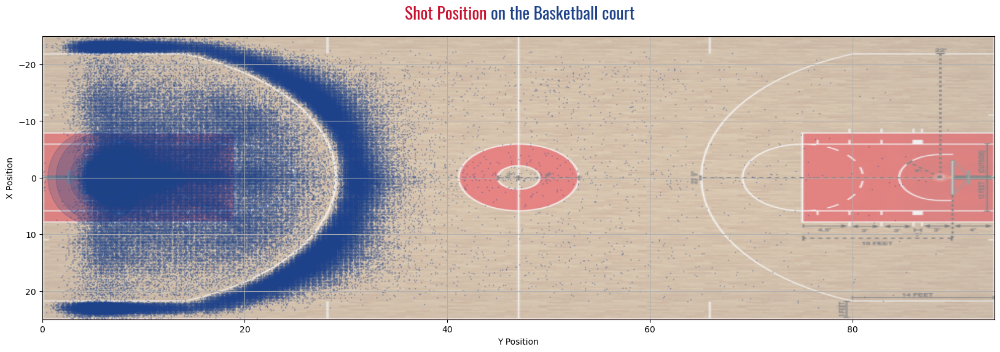

In [ ]:

# Crear figura y eje
fig, ax = plt.subplots(figsize=(20, 6))

# Graficar los puntos
grouped = nba_df.groupby(['LOC_X', 'LOC_Y']).size().reset_index(name='count')
scatter = ax.scatter(
    grouped['LOC_Y'], 
    grouped['LOC_X'], 
    s=grouped['count'],      
    alpha=0.2, 
    color='#1D428A'
)

# Imagen de fondo
background = mpimg.imread('cancha.png')
ax.imshow(background, extent=[0, 94, 25, -25], aspect='auto', alpha=0.5)

# Configuración de ejes
ax.set_xlabel('Y Position')
ax.set_ylabel('X Position')
ax.set_xlim(0, 94)
ax.set_ylim(25, -25)
ax.grid(True)

# Cargar la fuente Oswald (Variable Font)
oswald_fp = FontProperties(fname='Oswald-VariableFont_wght.ttf', size=20)
# Crear título en dos partes con fig.text
# Ajusta los valores 0.35 y 0.52 para centrar visualmente el texto
fig.text(0.42, 0.94, "Shot Position ", fontproperties=oswald_fp, color=colores[0], ha='left', va='center')
fig.text(0.49, 0.94, "on the Basketball court", fontproperties=oswald_fp, color=colores[1], ha='left', va='center')

# Mostrar gráfico
plt.show()



We can see that most of the shots are thrown in two main hotspots:

Under the hoop. <br></br>
Triple Line Zone.

With most of the shots being centered, or in the case of the triple line zone, perpendicular to the hoop (dead zone)


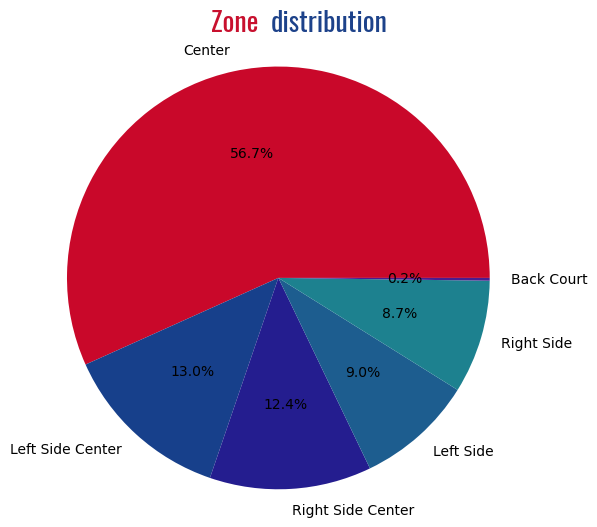

In [49]:
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

# Fuente Oswald con tamaño 20
oswald_fp = FontProperties(fname='Oswald-VariableFont_wght.ttf', size=20)

# Contar zonas
x = nba_df['ZONE_NAME'].value_counts()

# Crear figura y gráfico de pastel
fig, ax = plt.subplots(figsize=(6, 6))
ax.pie(
    x.values, 
    labels=x.index, 
    autopct='%1.1f%%', 
    shadow=False, 
    colors=('#C9082A','#17408B','#241D8F','#1D5D8F','#1D818F','#4A1D8F')
)
ax.axis('equal')  # Hace que el gráfico sea un círculo perfecto

# Añadir título multicolor con Oswald
fig.text(0.40, 0.92, "Zone ", fontproperties=oswald_fp, color=colores[0], ha='left', va='center')
fig.text(0.50, 0.92, "distribution", fontproperties=oswald_fp, color=colores[1], ha='left', va='center')

plt.show()






However, even if these zones are the prefered ones, there may exist some differents in between those hotspots.

Following, we will divide these distributions between those shots that made it, and those shots that missed the points

In [51]:
nba_acertados = nba_df[nba_df['SHOT_MADE'] == 1].copy()
nba_fallados = nba_df[nba_df['SHOT_MADE'] == 0].copy()

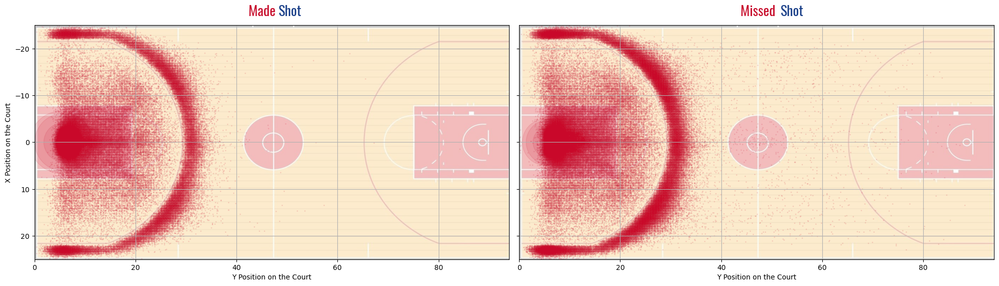

In [55]:
# Cargar fuente Oswald
oswald_fp = FontProperties(fname='Oswald-VariableFont_wght.ttf', size=20)

# Agrupar datos
grouped_made = nba_acertados.groupby(['LOC_X', 'LOC_Y']).size().reset_index(name='count')
grouped_missed = nba_fallados.groupby(['LOC_X', 'LOC_Y']).size().reset_index(name='count')

# Cargar imagen de fondo
background = mpimg.imread('fondo-basket.jpg')

# Crear subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 6), sharey=True)

# Primer subplot - tiros acertados
axes[0].scatter(
    grouped_made['LOC_Y'],
    grouped_made['LOC_X'],
    s=grouped_made['count'],
    alpha=0.1,
    color='#C9082A'
)
axes[0].imshow(background, extent=[0, 94, 25, -25], aspect='auto', alpha=0.3)
axes[0].set_xlim(0, 94)
axes[0].set_ylim(25, -25)
axes[0].set_xlabel('Y Position on the Court')
axes[0].set_ylabel('X Position on the Court')
axes[0].grid(True)

# Segundo subplot - tiros fallados
axes[1].scatter(
    grouped_missed['LOC_Y'],
    grouped_missed['LOC_X'],
    s=grouped_missed['count'],
    alpha=0.1,
    color='#C9082A'
)
axes[1].imshow(background, extent=[0, 94, 25, -25], aspect='auto', alpha=0.3)
axes[1].set_xlim(0, 94)
axes[1].set_ylim(25, -25)
axes[1].set_xlabel('Y Position on the Court')
axes[1].set_ylabel('')
axes[1].grid(True)

# Títulos personalizados con fig.text()
# Coordenadas ajustadas manualmente para centrar sobre cada subplot
fig.text(0.25, 0.92, "Made ", fontproperties=oswald_fp, color=colores[0], ha='left', va='center')
fig.text(0.28, 0.92, "Shot", fontproperties=oswald_fp, color=colores[1], ha='left', va='center')

fig.text(0.74, 0.92, "Missed ", fontproperties=oswald_fp, color=colores[0], ha='left', va='center')
fig.text(0.78, 0.92, "Shot", fontproperties=oswald_fp, color=colores[1], ha='left', va='center')

# Ajustar espacio
plt.tight_layout(rect=[0, 0, 1, 0.9])  # deja espacio para los títulos arriba
plt.show()

Even thought it may be minor, we can observe an slight difference between the effectivity of the shots.

We can see a noticeable less density in the shots that were thrown from the triple line zone, specially in those zones that are neither perpendicular nor centered to the hoop.

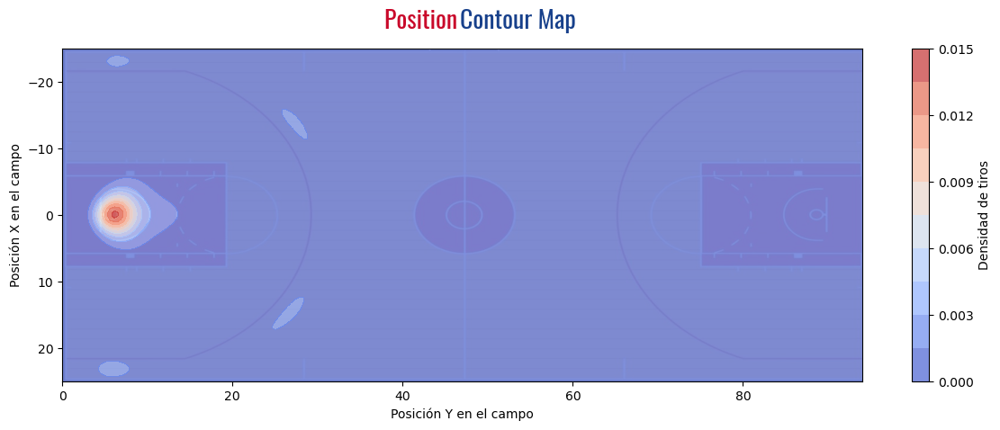

In [59]:

# Colores personalizados
colores = ['#C9082A', '#17408B']  # rojo NBA y azul NBA

# Fuente Oswald
oswald_fp = FontProperties(fname='Oswald-VariableFont_wght.ttf', size=20)

# Datos filtrados
x = season_23_24['LOC_Y']
y = season_23_24['LOC_X']

mask = (x >= 0) & (x <= 94) & (y >= -25) & (y <= 25)
x_filtered = x[mask]
y_filtered = y[mask]

# Malla y densidad KDE
xi, yi = np.mgrid[0:94:200j, -25:25:200j]
positions = np.vstack([xi.ravel(), yi.ravel()])
values = np.vstack([x_filtered, y_filtered])
kernel = gaussian_kde(values, bw_method='scott')
zi = kernel(positions).reshape(xi.shape)

# Fondo
background = mpimg.imread('fondo-basket.jpg')

# Crear figura
fig, ax = plt.subplots(figsize=(12, 5), dpi=100)

# Fondo del campo
ax.imshow(background, extent=[0, 94, 25, -25], aspect='auto', alpha=0.3)

# Contorno de densidad
contour = ax.contourf(xi, yi, zi, levels=10, cmap='coolwarm', alpha=0.7)

# Ejes
ax.set_xlabel('Posición Y en el campo')
ax.set_ylabel('Posición X en el campo')
ax.set_xlim(0, 94)
ax.set_ylim(25, -25)

# Título multicolor con fig.text()
fig.text(0.36, 0.92, "Position ", fontproperties=oswald_fp, color=colores[0], ha='left', va='center')
fig.text(0.43, 0.92, "Contour Map", fontproperties=oswald_fp, color=colores[1], ha='left', va='center')

# Barra de color y diseño
plt.colorbar(contour, ax=ax, label='Densidad de tiros')
plt.tight_layout(rect=[0, 0, 1, 0.9])  # Deja espacio para el título
plt.show()


### Count of shots by zone

 On a more detailed approach, we can perceived these difference in a bar chart

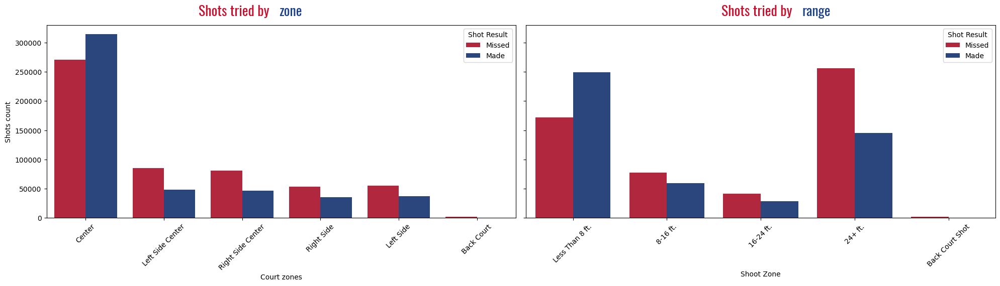

In [67]:
# Cargar la fuente Oswald
font_path = "Oswald-VariableFont_wght.ttf"
font_prop = fm.FontProperties(fname=font_path, size=20)

# Colores personalizados
colores = {0: '#C8102E', 1: '#1D428A'}

# Orden de las zonas
orden_deseado = ['Less Than 8 ft.', '8-16 ft.', '16-24 ft.', '24+ ft.', 'Back Court Shot']

# Crear figura con subgráficos
fig, ax = plt.subplots(1, 2, figsize=(20, 6), sharey=True)

# Gráfico 1: Shots tried by zone
sns.countplot(
    data=nba_df,
    x='ZONE_NAME',
    hue='SHOT_MADE',
    palette=colores,
    ax=ax[0]
)
ax[0].set_xlabel('Court zones')
ax[0].set_ylabel('Shots count')
ax[0].legend(title='Shot Result', labels=['Missed', 'Made'])
ax[0].tick_params(axis='x', rotation=45)

# Título para el gráfico de zona (dividido en rojo y azul)
fig.text(0.20, 0.92, "Shots tried by ", fontproperties=font_prop, color=colores[0], ha='left', va='center')
fig.text(0.28, 0.92, "zone", fontproperties=font_prop, color=colores[1], ha='left', va='center')

# Gráfico 2: Shots tried by range
sns.countplot(
    data=nba_df,
    x='ZONE_RANGE',
    hue='SHOT_MADE',
    order=orden_deseado,
    palette=colores,
    ax=ax[1]
)
ax[1].set_xlabel('Shoot Zone')
ax[1].set_ylabel('Amount of tries')
ax[1].legend(title='Shot Result', labels=['Missed', 'Made'])
ax[1].tick_params(axis='x', rotation=45)

# Título para el gráfico de rango (dividido en rojo y azul)
fig.text(0.72, 0.92, "Shots tried by ", fontproperties=font_prop, color=colores[0], ha='left', va='center')
fig.text(0.80, 0.92, "range", fontproperties=font_prop, color=colores[1], ha='left', va='center')

# Ajustar el diseño y mostrar
plt.tight_layout(rect=[0, 0, 1, 0.9])  # Deja espacio para los títulos arriba
plt.show()



In [66]:
print('As we can observe, we find some patterns that we have mention previously, getting the center the main focus. both at less than 8ft (hoop zone) and 24+ ft zone')
print("-"*100)
nba_df.groupby('ZONE_RANGE')[['ZONE_NAME','ZONE_RANGE']].value_counts()

As we can observe, we find some patterns that we have mention previously, getting the center the main focus. both at less than 8ft (hoop zone) and 24+ ft zone
----------------------------------------------------------------------------------------------------


ZONE_RANGE       ZONE_NAME        
16-24 ft.        Center                19310
                 Right Side Center     18783
                 Left Side Center      17568
                 Left Side              7442
                 Right Side             7054
24+ ft.          Left Side Center     116892
                 Right Side Center    108932
                 Center                77159
                 Left Side             51517
                 Right Side            46985
8-16 ft.         Center                67301
                 Right Side            35479
                 Left Side             33655
Back Court Shot  Back Court             2189
Less Than 8 ft.  Center               421417
Name: count, dtype: int64

Close to a half are made at 8 ft or less of the hoop, with the majority of it being centered. The other half is distributed between the other zones, being second most frequent the 24+ ft zone, with over a 100k shots

There is also a dramatic on the effectiveness of the shots as we predicted.

#### Efectividad de tiros por zona

In [124]:
nba_df.groupby('ZONE_RANGE')[['SHOT_MADE']].mean()*100


,SHOT_MADE
ZONE_RANGE,
16-24 ft.,40.637427
24+ ft.,36.263621
8-16 ft.,43.371569
Back Court Shot,2.878026
Less Than 8 ft.,59.124098


Close to the hoop shots, specially on the less than 8ft shows to be the most succesful range of all, with close to a 60% of sucess rate. 20% over the mid range (8-16ft) and the triple zone range (16-24ft and 24+ ft)

### High risk shots

As It may become natural, not all shots are throwed under the same cinrcumstances. The score, the quarter they are playing and the time left in that quarter are factores that can determinate high pressure situations. With this information, and knowing the advantage of close shots, we look for relationships between shot distance and time_left

Null Hypothesis: The less time there is left, doesnt mean the shot distance increases

Alt Hypothesis: The less time there is left, the shot distance tends to increase

In [8]:
nba_ct = pd.crosstab(nba_df['TIME_LEFT_SECONDS'],nba_df['SHOT_DISTANCE'])

from scipy.stats import chi2_contingency

chi2, p, dof, expected= chi2_contingency(nba_ct)

if p < 0.05:
    print(p)
    print('Null hypothesis rejected. The less time in the score, the higher the shot distance')
elif p > 0.05:
    print(p)
    print('There is correlation')

0.0
Null hypothesis rejected. The less time in the score, the higher the shot distance


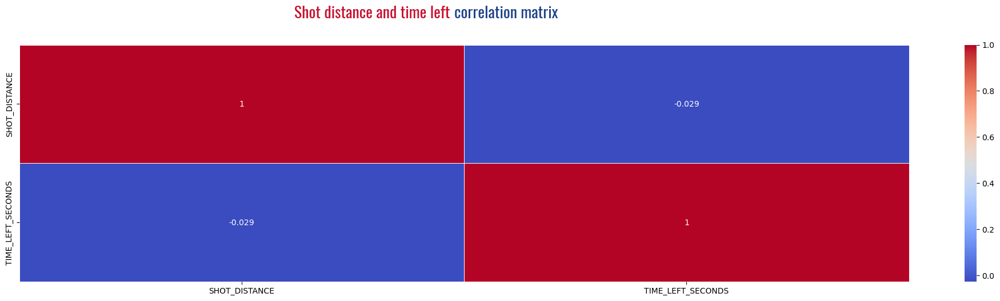

In [71]:
# Configurar fuente Oswald
font_path = "Oswald-VariableFont_wght.ttf"
font_prop = fm.FontProperties(fname=font_path, size=20)

# Datos para el análisis
analysis = ['SHOT_DISTANCE', 'TIME_LEFT_SECONDS']
nba_analysis = nba_df[analysis]
nba_corr = nba_analysis.corr()

# Crear la figura
fig, ax = plt.subplots(figsize=(20, 5))

# Heatmap
sns.heatmap(nba_corr, annot=True, cmap='coolwarm', linewidths=0.5, ax=ax)

# Título dividido en rojo y azul
fig.text(0.26, 1.02, "Shot distance and time left ", fontproperties=font_prop, color=colores[0], ha='left', va='center')
fig.text(0.40, 1.02, "correlation matrix", fontproperties=font_prop, color=colores[1], ha='left', va='center')

# Ajustar espacio
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

A weak inverse correlation of 0.029 exist between shot distance and the time left of the quarter

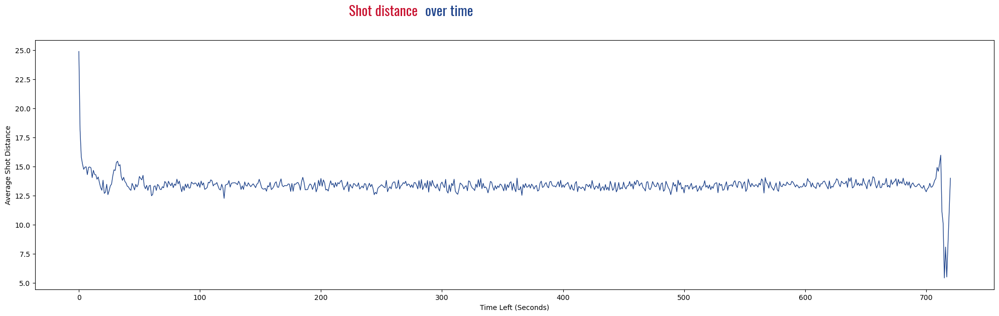

In [76]:
# Fuente Oswald
font_path = "Oswald-VariableFont_wght.ttf"
font_prop = fm.FontProperties(fname=font_path, size=20)

# Datos agrupados
shots_by_distance = nba_df.groupby('TIME_LEFT_SECONDS')['SHOT_DISTANCE'].mean().reset_index()

# Crear figura y eje
fig, ax = plt.subplots(figsize=(20, 6))

# Línea
sns.lineplot(
    x='TIME_LEFT_SECONDS', 
    y='SHOT_DISTANCE', 
    data=shots_by_distance,
    linewidth=1,
    color='#1D428A',
    ax=ax
)

# Etiquetas de ejes
ax.set_xlabel('Time Left (Seconds)')
ax.set_ylabel('Average Shot Distance')

# Título multicolor
fig.text(0.35, 1.02, "Shot distance ", fontproperties=font_prop, color=colores[0], ha='left', va='center')
fig.text(0.426, 1.02, "over time", fontproperties=font_prop, color=colores[1], ha='left', va='center')

# Ajustar espacio para el título
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()



On the line graph we can observe it even more clear it. Most shots are made at a relative equal distance during the course of the game, except the final few minutes of the quarter, where we can see riskier shots far away than the triple line zone.

#### Shots before the last minute

In [ ]:
last_minute = nba_df[nba_df['TIME_LEFT_SECONDS'] > 60]
last_minute['ZONE_RANGE'].value_counts(normalize=True).sort_index()*100


ZONE_RANGE
16-24 ft.           6.547471
24+ ft.            42.807854
8-16 ft.           11.082636
Back Court Shot     2.150913
Less Than 8 ft.    37.411127
Name: proportion, dtype: float64

#### Shots at the last minute

In [33]:
last_minute = nba_df[nba_df['TIME_LEFT_SECONDS'] < 60]
last_minute['ZONE_RANGE'].value_counts(normalize=True).sort_index()*100


ZONE_RANGE
16-24 ft.           6.547471
24+ ft.            42.807854
8-16 ft.           11.082636
Back Court Shot     2.150913
Less Than 8 ft.    37.411127
Name: proportion, dtype: float64

### Shot accuracy before and at the last minute

In [35]:
last_minute = nba_df[nba_df['TIME_LEFT_SECONDS'] > 60]
last_minute['SHOT_MADE'].value_counts(normalize=True).sort_index()*100

SHOT_MADE
False    52.729493
True     47.270507
Name: proportion, dtype: float64

In [36]:
last_minute = nba_df[nba_df['TIME_LEFT_SECONDS'] < 60]
last_minute['SHOT_MADE'].value_counts(normalize=True).sort_index()*100

SHOT_MADE
False    57.995872
True     42.004128
Name: proportion, dtype: float64

### Shot distance by quarter

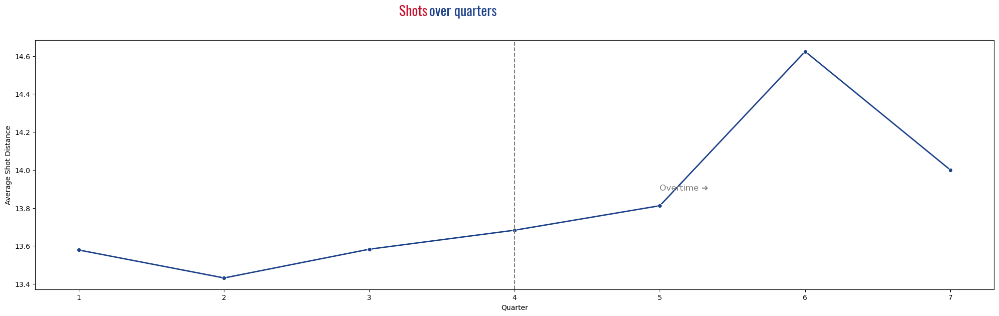

In [78]:
# Cargar fuente Oswald
font_path = "Oswald-VariableFont_wght.ttf"
font_prop = fm.FontProperties(fname=font_path, size=20)

# Datos agrupados por cuarto
shots_by_quarter = nba_df.groupby('QUARTER')['SHOT_DISTANCE'].mean().reset_index()

# Crear figura y eje
fig, ax = plt.subplots(figsize=(20, 6))

# Gráfico de línea
sns.lineplot(
    x='QUARTER', 
    y='SHOT_DISTANCE', 
    data=shots_by_quarter,
    marker='o',
    linewidth=2,
    color='#1D428A',
    ax=ax
)

# Línea vertical y texto de overtime
plt.axvline(x=4, color='gray', linestyle='--')
plt.text(5, shots_by_quarter['SHOT_DISTANCE'].max() * 0.95, 'Overtime ➜', color='gray', fontsize=12)

# Etiquetas de ejes
ax.set_xlabel('Quarter')
ax.set_ylabel('Average Shot Distance')

# Título con dos colores
fig.text(0.40, 1.02, "Shots ", fontproperties=font_prop, color=colores[0], ha='left', va='center')
fig.text(0.43, 1.02, "over quarters", fontproperties=font_prop, color=colores[1], ha='left', va='center')

# Ajustar espacio para título
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

Following the trends observe on the previous point. The latter quarter seems to have riskier shoots. However, the main driver that makes those shoots ocurr are the overtime phases, making the teams to play riskier, not yet more succesfull, shots

 ## Shots By Type

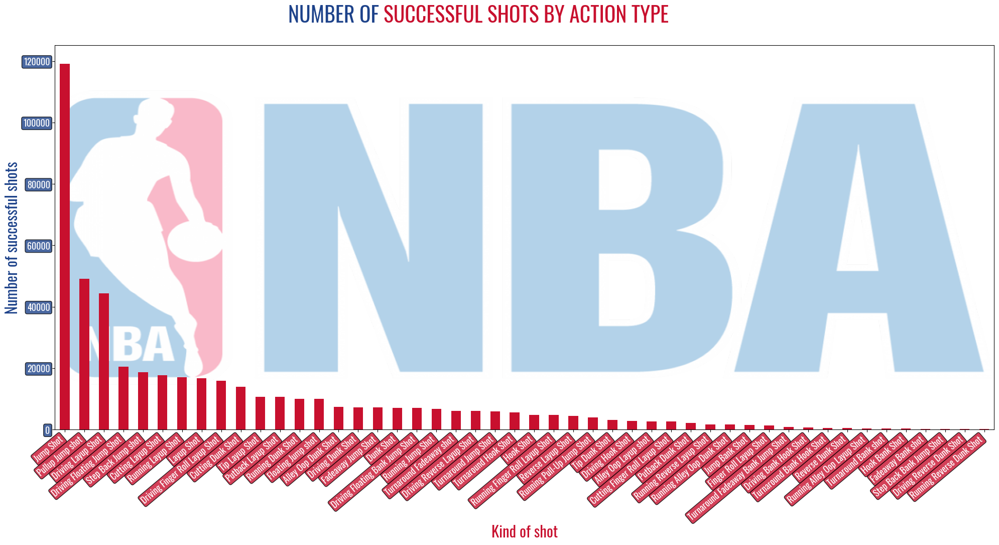

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import matplotlib.font_manager as fm

# Leer datos
df = pd.read_csv('DB-NBA-cleaned.csv')

# Agrupar y ordenar los datos
aciertos_por_tiro = df.groupby('ACTION_TYPE')['SHOT_MADE'].sum().sort_values(ascending=False)

# Ruta a la fuente Oswald Bold
font_path = '/home/reboot-student/Downloads/Oswald/Oswald-VariableFont_wght.ttf'
font_prop = fm.FontProperties(fname=font_path)

# Cargar imagen de fondo
img = Image.open('/home/reboot-student/Pictures/Useful images/NBA-logo-png-download-free-1200x675.png')
img_array = np.array(img)

# Crear figura
fig, ax = plt.subplots(figsize=(20, 11))

# Gráfico de barras
aciertos_por_tiro.plot(kind='bar', color='#C8102E', ax=ax)

# Imagen de fondo
ax.imshow(
    img_array,
    extent=[-0.5, len(aciertos_por_tiro)-0.5, 0, ax.get_ylim()[1]],
    aspect='auto',
    alpha=0.3,
    zorder=0
)

# Título en dos colores
ax.text(0.35, 1.05, "NUMBER OF ", transform=ax.transAxes,
        fontproperties=font_prop, fontsize=30, color='#1D428A',
        ha='right', va='bottom')

ax.text(0.35, 1.05, "SUCCESSFUL SHOTS BY ACTION TYPE", transform=ax.transAxes,
        fontproperties=font_prop, fontsize=30, color='#C8102E',
        ha='left', va='bottom')

# Ejes y etiquetas
ax.set_xlabel("Kind of shot", fontproperties=font_prop, fontsize=22, color='#C8102E')
ax.set_ylabel("Number of successful shots", fontproperties=font_prop, fontsize=22, color='#1D428A')

# Estilo etiquetas eje X
for label in ax.get_xticklabels():
    label.set_fontproperties(font_prop)
    label.set_fontsize(13)
    label.set_rotation(40)
    label.set_ha('right')
    label.set_color("white")
    label.set_bbox(dict(
        facecolor='#C8102E',
        edgecolor='black',
        boxstyle='round,pad=0.2',
        alpha=0.8
    ))

# Estilo etiquetas eje Y
for label in ax.get_yticklabels():
    label.set_fontproperties(font_prop)
    label.set_fontsize(13)
    label.set_color("white")
    label.set_bbox(dict(
        facecolor='#1D428A',
        edgecolor='black',
        boxstyle='round,pad=0.2',
        alpha=0.8
    ))

plt.tight_layout()
plt.show()




1. ***The "Jump Shot" clearly dominates***

With over 120,000 successful shots, the Jump Shot is by far the most common and successful shot type in the NBA.

This highlights its central role in the modern game, where mid- and long-range shooting is essential.

2. ***Layups are also very frequent***

Types like Driving Layup Shot, Layup Shot, and Running Layup Shot are among the most successful (ranging from 40,000 to 50,000).

This shows that drives to the basket remain a very efficient scoring method.

3. ***Other shot types have a much smaller presence***

Most other shot types have fewer than 20,000 makes, with many even below 5,000.

This includes shots like Fadeaway, Hook Shot, Dunk Shot, and others that are more specific or spectacular (Alley Oop, Reverse Dunk, etc.).

4. ***Spectacular shots are rarer***

Types like Running Reverse Dunk Shot, Step Back Bank Jump Shot, or Running Hook Shot have very few successful attempts, suggesting these are less common or more difficult situations.

5. ***Diversity of shot types***

The chart shows a wide variety of shot types, reflecting the creativity and versatility in the NBA game.


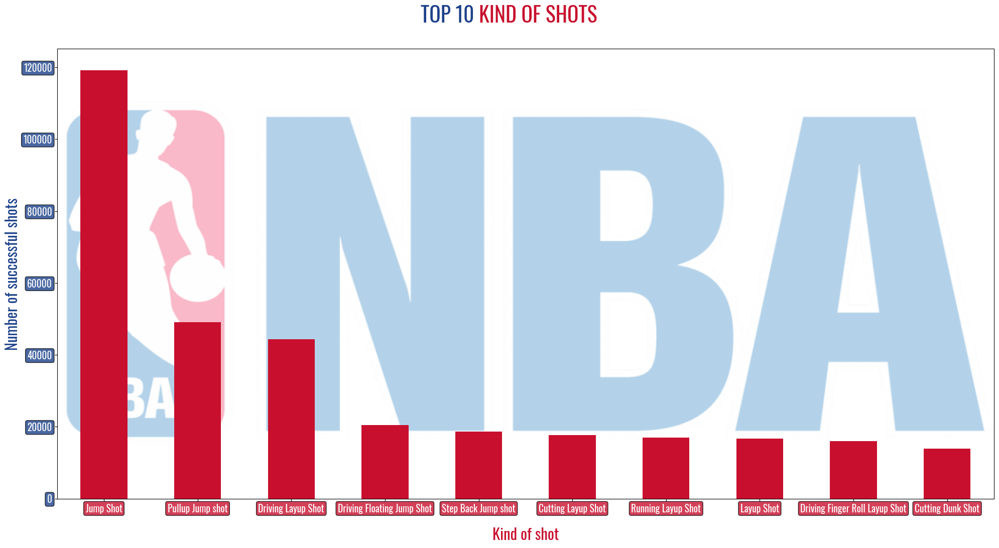

In [28]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import matplotlib.font_manager as fm
import streamlit as st


font_path = "/home/reboot-student/Downloads/Oswald/Oswald-VariableFont_wght.ttf"
font_prop = fm.FontProperties(fname=font_path)

img = Image.open("/home/reboot-student/Pictures/Useful images/NBA-logo-png-download-free-1200x675.png")
img_array = np.array(img)

fig, ax = plt.subplots(figsize=(20, 11))


df[df["SHOT_MADE"] == 1] \
    .groupby("ACTION_TYPE")["SHOT_MADE"] \
    .count() \
    .sort_values(ascending=False) \
    .head(10) \
    .plot(kind='bar', color='#C8102E', ax=ax)

ax.imshow(
    img_array,
    extent=[-0.5, 9.5, 0, ax.get_ylim()[1]],
    alpha=0.3,
    aspect='auto',
    zorder=0
)

ax.text(0.45, 1.05, "TOP 10 ", transform=ax.transAxes,
        fontproperties=font_prop, fontsize=30, color='#1D428A',
        ha='right', va='bottom')

ax.text(0.45, 1.05, "KIND OF SHOTS", transform=ax.transAxes,
        fontproperties=font_prop, fontsize=30, color='#C8102E',
        ha='left', va='bottom')

ax.set_xlabel("Kind of shot", fontproperties=font_prop, fontsize=22, color='#C8102E', labelpad=20)
ax.set_ylabel("Number of successful shots", fontproperties=font_prop, fontsize=22, color='#1D428A')

for label in ax.get_xticklabels():
    label.set_fontproperties(font_prop)
    label.set_fontsize(14)
    label.set_rotation(0)
    label.set_color("white")
    label.set_bbox(dict(
        facecolor='#C8102E',
        edgecolor='black',
        boxstyle='round,pad=0.2',
        alpha=0.8
    ))

for label in ax.get_yticklabels():
    label.set_fontproperties(font_prop)
    label.set_fontsize(14)
    label.set_color("white")
    label.set_bbox(dict(
        facecolor='#1D428A',
        edgecolor='black',
        boxstyle='round,pad=0.2',
        alpha=0.8
    ))

plt.tight_layout()
plt.show()

***Big gap with second place:***

The Pullup Jump Shot ranks second, but with less than half as many conversions (~50,000).

This suggests that while it is also common, it is neither as widely used nor as effective as the Jump Shot.

***Drives to the basket (layups and floaters) are key, but varied:***

Types like Driving Layup Shot, Driving Floating Jump Shot, and Cutting Layup Shot all appear in the top 10.

This highlights the importance of plays near the basket, though they vary depending on the game context.

***Few dunks in comparison:***

The Cutting Dunk Shot ranks last in the top 10, suggesting that while dunks are spectacular, they are much less common than other finishing types.

***More difficult or technical shots are less common:***

Shots like the Step Back Jump Shot or Driving Finger Roll Layup Shot appear at the bottom of the top 10, likely due to their complexity or more situational use.


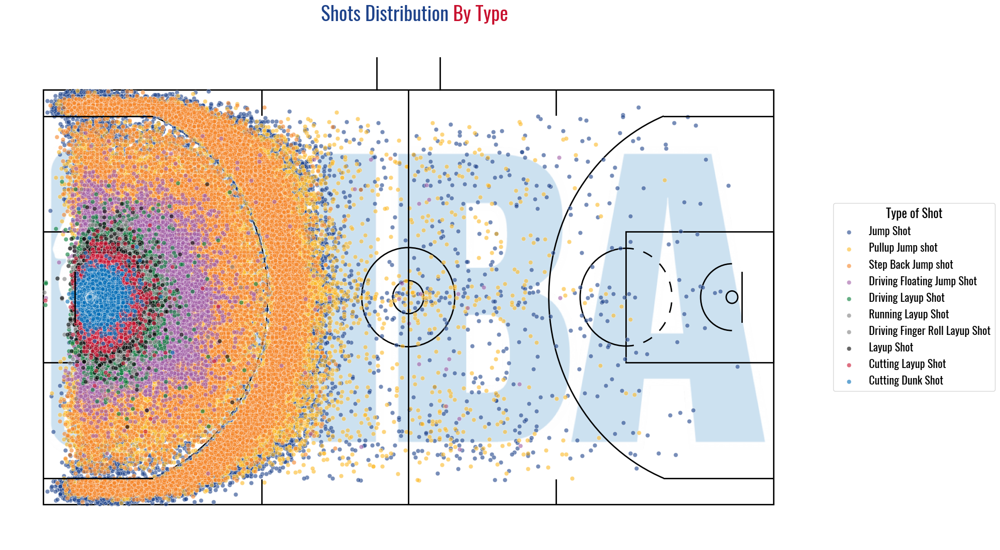

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
from mplbasketball import Court
import matplotlib.font_manager as fm
from PIL import Image
import numpy as np

# --- Configurar fuente personalizada ---
font_path = "/home/reboot-student/Downloads/Oswald/Oswald-VariableFont_wght.ttf"
font_prop = fm.FontProperties(fname=font_path)

# --- Cargar imagen de fondo (marca de agua) ---
img = Image.open("/home/reboot-student/Pictures/Useful images/NBA-logo-png-download-free-1200x675.png")
img_array = np.array(img)

# --- Diccionario de colores por tipo de tiro ---
colores_por_tipo = {
    "Jump Shot": "#1D428A",                   # Azul (NBA / 76ers)
    "Pullup Jump shot": "#FDB927",            # Amarillo (Lakers)
    "Step Back Jump shot": "#F58426",         # Naranja (Knicks)
    "Driving Floating Jump Shot": "#A05DA5",  # Púrpura (Kings)
    "Running Layup shot": "#2CA6A4",          # Azul claro (Mavs)
    "Driving Finger Roll Layup shot": "#A8E10C",  # Verde Lima
    "Layup Shot": "#000000",                  # Negro (Nets)
    "Driving Layup Shot": "#007A33",          # Verde (Celtics)
    "Cutting Layup Shot": "#C8102E",          # Rojo (Bulls)
    "Cutting Dunk Shot": "#006BB6"            # Azul fuerte (Pistons)
}


# --- Filtrar los datos por tipo de tiro ---
tipos_tiro = [
    "Jump Shot", 
    "Pullup Jump shot",
    "Step Back Jump shot",
    "Driving Floating Jump Shot", 
    "Driving Layup Shot", 
    "Running Layup Shot",
    "Driving Finger Roll Layup Shot",
    "Layup Shot",
    "Cutting Layup Shot",
    "Cutting Dunk Shot"
]
df_filtrado = df[df["ACTION_TYPE"].isin(tipos_tiro)].copy()

# --- Ajustar coordenadas si es necesario ---
df_filtrado.loc[:, "LOC_Y"] = df_filtrado["LOC_Y"] - 47

# --- Crear figura y eje ---
fig, ax = plt.subplots(figsize=(20, 11))

# --- Dibujar la cancha ---
court = Court(court_type="nba", origin="center", units="ft")
court.draw(ax=ax)

# --- Insertar imagen de fondo como marca de agua ---
ax.imshow(
    img_array,
    extent=[-47, 47, -25, 25],
    alpha=0.2,
    aspect='auto',
    zorder=0
)

# --- Dibujar tiros ---
for tipo in tipos_tiro:
    tiros_tipo = df_filtrado[df_filtrado["ACTION_TYPE"] == tipo]
    ax.scatter(
        tiros_tipo["LOC_Y"], tiros_tipo["LOC_X"],
        label=tipo,
        alpha=0.6,
        s=40,
        edgecolors="white",
        linewidth=0.5,

        color=colores_por_tipo.get(tipo, "gray")  # Color asignado
    )

# --- Título dividido en dos colores ---
ax.text(0.55, 1.05, "Shots Distribution", transform=ax.transAxes,
        fontproperties=font_prop, fontsize=28, color='#1D428A',
        ha='right', va='bottom')

ax.text(0.55, 1.05, " By Type", transform=ax.transAxes,
        fontproperties=font_prop, fontsize=28, color='#C8102E',
        ha='left', va='bottom')

# --- Leyenda centrada verticalmente al lado derecho y agrandada ---
legend = ax.legend(
    title="Type of Shot",
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    fontsize=16
)
plt.setp(legend.get_title(), fontproperties=font_prop, fontsize=18)
for text in legend.get_texts():
    text.set_fontproperties(font_prop)
    text.set_fontsize(16)

# --- Quitar ejes y ajustar diseño ---
ax.axis("off")
plt.tight_layout()
plt.show()



***1. Jump Shots (Jump Shot and Step Back Jump Shot) dominate the perimeter***

The blue and orange dots (Jump Shot and Step Back Jump Shot) are heavily concentrated around the three-point line and in the corners, reflecting the importance of the 3-point shot in modern basketball.

There is also noticeable concentration in the mid-range area, indicating that players still use mid-range shots, though less frequently.

***2. High concentration of shots near the rim***

Inside the paint (restricted area), there is a large number of shots of various types, especially:

Layup Shot (black)  
Driving Layup Shot (green)  
Running Layup Shot (purple)  
Cutting Layup Shot (red)  
Cutting Dunk Shot (darker cyan)

This suggests that attacking the rim remains a fundamental part of the game, whether through drives, cuts, or fast breaks.

***3. Floaters (Driving Floating Jump Shot – light violet) are also concentrated near the rim***

They are common in the mid-paint area, indicating that this is a common technique to avoid direct contact with taller defenders.

***4. The Pullup Jump Shot (yellow) is spread out but mostly appears in the mid-range and perimeter area***

This suggests it is a common tool in transition situations or when a player creates their own space.

***5. Asymmetrical distribution by play type***

Although the chart focuses on one half of the court, it also shows attempts on the other half (possibly due to errors or fast possessions), but in very small numbers.


### ***Separed Shots Plots***

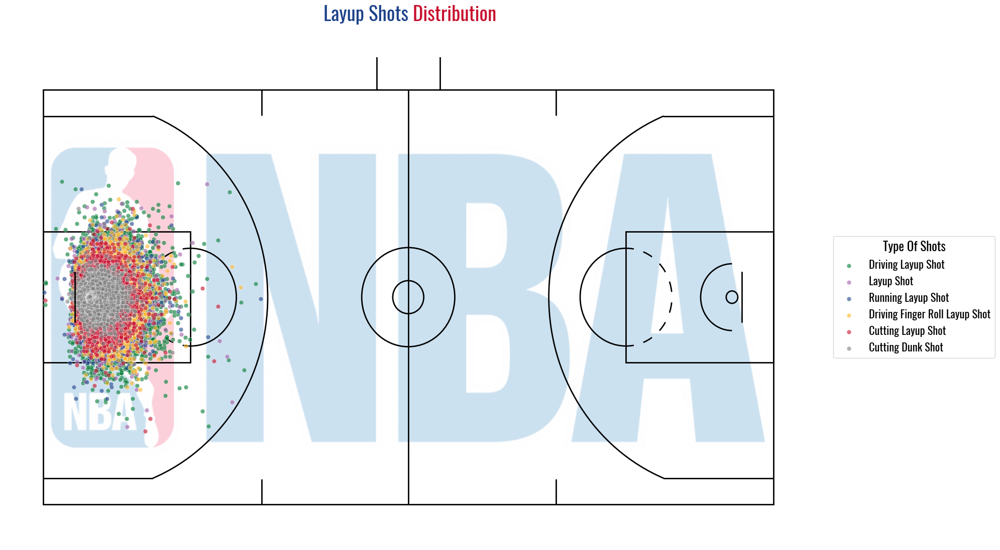

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
from mplbasketball import Court
import matplotlib.font_manager as fm
from PIL import Image
import numpy as np

# --- Configurar fuente personalizada ---
font_path = "/home/reboot-student/Downloads/Oswald/Oswald-VariableFont_wght.ttf"
font_prop = fm.FontProperties(fname=font_path)

# --- Cargar imagen de fondo (marca de agua) ---
img = Image.open("/home/reboot-student/Pictures/Useful images/NBA-logo-png-download-free-1200x675.png")
img_array = np.array(img)

# --- Diccionario de colores por tipo de tiro ---
colores_por_tipo = {
    "Running Layup Shot": "#1D428A",  # azul
    "Driving Finger Roll Layup Shot": "#FDB927",  # amarillo
    "Layup Shot": "#A05DA5",  # púrpura
    "Driving Layup Shot": "#007A33",  # verde
    "Cutting Layup Shot": "#C8102E",  # rojo
}

# --- Filtrar los datos por tipo de tiro ---
tipos_tiro = [
    "Driving Layup Shot", 
    "Layup Shot",
    "Running Layup Shot",
    "Driving Finger Roll Layup Shot",
    "Cutting Layup Shot",
    "Cutting Dunk Shot"
    
    
    

]
df_filtrado = df[df["ACTION_TYPE"].isin(tipos_tiro)].copy()

# --- Ajustar coordenadas si es necesario ---
df_filtrado.loc[:, "LOC_Y"] = df_filtrado["LOC_Y"] - 47

# --- Crear figura y eje ---
fig, ax = plt.subplots(figsize=(20, 11))

# --- Dibujar la cancha ---
court = Court(court_type="nba", origin="center", units="ft")
court.draw(ax=ax)

# --- Insertar imagen de fondo como marca de agua ---
ax.imshow(
    img_array,
    extent=[-47, 47, -25, 25],
    alpha=0.2,
    aspect='auto',
    zorder=0
)

# --- Dibujar tiros ---
for tipo in tipos_tiro:
    tiros_tipo = df_filtrado[df_filtrado["ACTION_TYPE"] == tipo]
    ax.scatter(
        tiros_tipo["LOC_Y"], tiros_tipo["LOC_X"],
        label=tipo,
        alpha=0.6,
        s=40,
        edgecolors="white",
        linewidth=0.5,

        color=colores_por_tipo.get(tipo, "gray")  # Color asignado
    )

# --- Título dividido en dos colores ---
ax.text(0.5, 1.05, "Layup Shots", transform=ax.transAxes,
        fontproperties=font_prop, fontsize=28, color='#1D428A',
        ha='right', va='bottom')

ax.text(0.5, 1.05, " Distribution", transform=ax.transAxes,
        fontproperties=font_prop, fontsize=28, color='#C8102E',
        ha='left', va='bottom')

# --- Leyenda centrada verticalmente al lado derecho y agrandada ---
legend = ax.legend(
    title="Type Of Shots",
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    fontsize=16
)
plt.setp(legend.get_title(), fontproperties=font_prop, fontsize=18)
for text in legend.get_texts():
    text.set_fontproperties(font_prop)
    text.set_fontsize(16)

# --- Quitar ejes y ajustar diseño ---
ax.axis("off")
plt.tight_layout()
plt.show()

***1. Very high concentration in the paint***

All types of layups are heavily concentrated within the restricted area (close to the basket), which is expected since these plays are executed very near the hoop.

***2. Distribution by play type:***

**Layup Shot (gray):**  
This is the most common type, with high density directly under the rim. It likely includes low-resistance situations like cuts or offensive rebounds.

***Driving Layup Shot (green):***  
Shows a slightly wider distribution, suggesting drives from the perimeter or long cuts to the rim.

***Running Layup Shot (light blue):***  
Tends to start a bit farther from the basket, indicating motion plays like fast breaks or quick penetrations.

***Driving Finger Roll Layup Shot (orange):***  
Located right near the basket and along diagonal paths, typical of players avoiding blocks with a more technical finish.

***Cutting Layup Shot (red):***  
Shows a more lateral spread, possibly indicating cuts to the basket from the corners or elbows.

***Cutting Dunk Shot (black):***  
Highly concentrated directly under the rim, as expected for high-impact plays, usually from a pass or strong cut.

***3. Efficient spatial usage***

Unlike jump shots (which are spread around the perimeter), layups are exclusively concentrated in the most efficient scoring area, highlighting the strategic importance of attacking the paint.




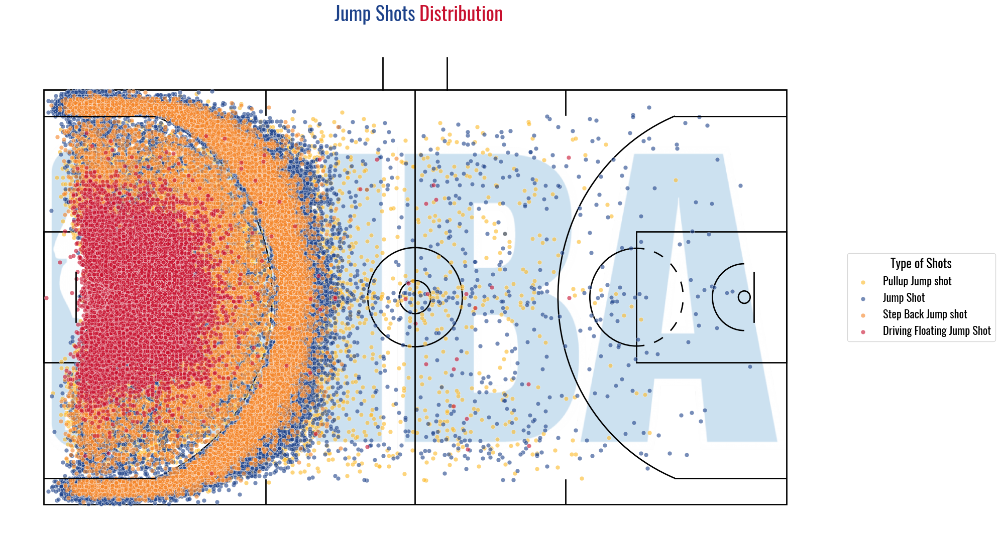

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
from mplbasketball import Court
import matplotlib.font_manager as fm
from PIL import Image
import numpy as np

# --- Configurar fuente personalizada ---
font_path = "/home/reboot-student/Downloads/Oswald/Oswald-VariableFont_wght.ttf"
font_prop = fm.FontProperties(fname=font_path)

# --- Cargar imagen de fondo (marca de agua) ---
img = Image.open("/home/reboot-student/Pictures/Useful images/NBA-logo-png-download-free-1200x675.png")
img_array = np.array(img)

# --- Diccionario de colores por tipo de tiro ---
colores_por_tipo = {
    "Jump Shot": "#1D428A",                   # Azul (NBA / 76ers)
    "Pullup Jump shot": "#FDB927",            # Amarillo (Lakers)
    "Step Back Jump shot": "#F58426",         # Naranja (Knicks)
    "Driving Floating Jump Shot": "#C8102E"  # Rojo
}


# --- Filtrar los datos por tipo de tiro ---
tipos_tiro = [
    "Pullup Jump shot",
    "Jump Shot", 
    "Step Back Jump shot",
    "Driving Floating Jump Shot"

]
df_filtrado = df[df["ACTION_TYPE"].isin(tipos_tiro)].copy()

# --- Ajustar coordenadas si es necesario ---
df_filtrado.loc[:, "LOC_Y"] = df_filtrado["LOC_Y"] - 47

# --- Crear figura y eje ---
fig, ax = plt.subplots(figsize=(20, 11))

# --- Dibujar la cancha ---
court = Court(court_type="nba", origin="center", units="ft")
court.draw(ax=ax)

# --- Insertar imagen de fondo como marca de agua ---
ax.imshow(
    img_array,
    extent=[-47, 47, -25, 25],
    alpha=0.2,
    aspect='auto',
    zorder=0
)

# --- Dibujar tiros ---
for tipo in tipos_tiro:
    tiros_tipo = df_filtrado[df_filtrado["ACTION_TYPE"] == tipo]
    ax.scatter(
        tiros_tipo["LOC_Y"], tiros_tipo["LOC_X"],
        label=tipo,
        alpha=0.6,
        s=40,
        edgecolors="white",
        linewidth=0.5,

        color=colores_por_tipo.get(tipo, "gray")  # Color asignado
    )

# --- Título dividido en dos colores ---
ax.text(0.5, 1.05, "Jump Shots", transform=ax.transAxes,
        fontproperties=font_prop, fontsize=28, color='#1D428A',
        ha='right', va='bottom')

ax.text(0.5, 1.05, " Distribution", transform=ax.transAxes,
        fontproperties=font_prop, fontsize=28, color='#C8102E',
        ha='left', va='bottom')

# --- Leyenda centrada verticalmente al lado derecho y agrandada ---
legend = ax.legend(
    title="Type of Shots",
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    fontsize=16
)
plt.setp(legend.get_title(), fontproperties=font_prop, fontsize=18)
for text in legend.get_texts():
    text.set_fontproperties(font_prop)
    text.set_fontsize(16)

# --- Quitar ejes y ajustar diseño ---
ax.axis("off")
plt.tight_layout()
plt.show()

***1. High concentration around the perimeter (three-point and mid-range)***

There is a high density of points around the perimeter, especially in the corners and at the top of the three-point arc.

This reflects a clear trend in modern NBA: the three-point shot is a crucial part of the game.

***2. Mid-range area is less utilized***

The area between the paint and the three-point line (the "mid-range" zone) shows a noticeably lower shot density.

This confirms that mid-range shots are less frequent, likely due to their lower efficiency compared to threes and shots near the rim.

***3. Shot types by zone***

**Driving Floating Jump Shot (red):** Mostly concentrated near the basket, especially inside the paint. These are shots taken on the move, typically to avoid a defender.

**Step Back Jump Shot (orange):** Appear mainly on the perimeter, especially in common three-point shooting areas. This suggests the shot is used to create space before shooting from long range.

**Jump Shot (blue):** Fairly distributed, but with high density on the perimeter.

**Pullup Jump Shot (yellow):** Also appear on the perimeter and in the center of the mid-range area, which makes sense as it's commonly used after dribbling.

***4. Corners are hot spots for three-point shots***

The corners (especially the left side of the chart) show high shot density, mostly blue and orange, likely due to the shorter angle and distance of the corner three.


### ***EFICIENCIA DE TIRO***

In [32]:
import pandas as pd

# Cargar el dataset
df = pd.read_csv('DB-NBA-cleaned.csv')

# Agrupar por tipo de tiro y calcular intentos y aciertos
stats = df.groupby('ACTION_TYPE')['SHOT_MADE'].agg(['count', 'sum']).reset_index()
stats.columns = ['Tipo de tiro', 'Intentos', 'Aciertos']

# Calcular eficiencia
stats['Eficiencia (%)'] = (stats['Aciertos'] / stats['Intentos']) * 100

# Ordenar por eficiencia descendente
stats = stats.sort_values(by='Eficiencia (%)', ascending=False)

print(stats.head(10))  # Top 10 más eficientes


                   Tipo de tiro  Intentos  Aciertos  Eficiencia (%)
36    Running Reverse Dunk Shot       126       119       94.444444
31            Running Dunk Shot     10655      9996       93.815110
2             Cutting Dunk Shot     15035     13870       92.251413
29  Running Alley Oop Dunk Shot      1754      1610       91.790194
27            Reverse Dunk Shot       534       486       91.011236
25            Putback Dunk Shot      2455      2232       90.916497
0           Alley Oop Dunk Shot      8259      7373       89.272309
14                    Dunk Shot      8212      7124       86.751096
40                Tip Dunk Shot      3645      3106       85.212620
12    Driving Reverse Dunk Shot       192       159       82.812500


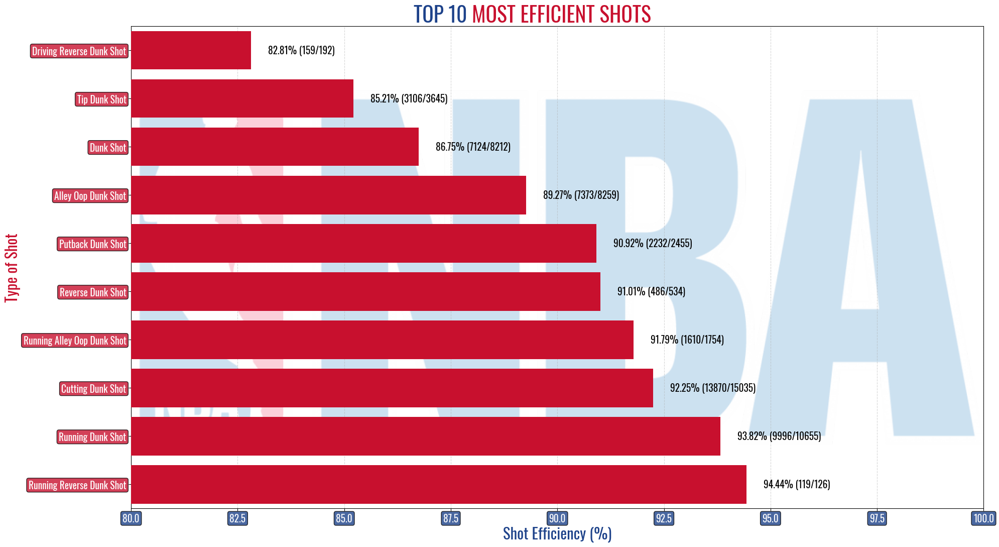

In [33]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.font_manager as fm

# Fuente y logo
font_path = "/home/reboot-student/Downloads/Oswald/Oswald-VariableFont_wght.ttf"
font_prop = fm.FontProperties(fname=font_path)
img = Image.open("/home/reboot-student/Pictures/Useful images/NBA-logo-png-download-free-1200x675.png")
img_array = np.array(img)

# Datos de eficiencia
data = {
    'Tipo de tiro': [
        'Running Reverse Dunk Shot', 'Running Dunk Shot', 'Cutting Dunk Shot',
        'Running Alley Oop Dunk Shot', 'Reverse Dunk Shot', 'Putback Dunk Shot',
        'Alley Oop Dunk Shot', 'Dunk Shot', 'Tip Dunk Shot', 'Driving Reverse Dunk Shot'
    ],
    'Intentos': [126, 10655, 15035, 1754, 534, 2455, 8259, 8212, 3645, 192],
    'Aciertos': [119, 9996, 13870, 1610, 486, 2232, 7373, 7124, 3106, 159],
    'Eficiencia (%)': [94.44, 93.82, 92.25, 91.79, 91.01, 90.92, 89.27, 86.75, 85.21, 82.81]
}

df = pd.DataFrame(data)

# Crear gráfico
fig, ax = plt.subplots(figsize=(20, 11))


bars = ax.barh(df['Tipo de tiro'], df['Eficiencia (%)'], color='#C8102E', zorder=3)

# Imagen de fondo
ax.imshow(img_array, extent=[80, 100, -0.5, 9.5], alpha=0.2, aspect='auto', zorder=0)

# Título estilizado
ax.text(0.4, 1, "TOP 10 ", transform=ax.transAxes,
        fontproperties=font_prop, fontsize=30, color='#1D428A',
        ha='right', va='bottom')

ax.text(0.4, 1, "MOST EFFICIENT SHOTS", transform=ax.transAxes,
        fontproperties=font_prop, fontsize=30, color='#C8102E',
        ha='left', va='bottom')

# Etiquetas de los ejes
ax.set_xlabel("Shot Efficiency (%)", fontproperties=font_prop, fontsize=22, color='#1D428A')
ax.set_ylabel("Type of Shot", fontproperties=font_prop, fontsize=22, color='#C8102E')
ax.set_xlim(80, 100)

ax.grid(axis='x', linestyle='--', alpha=0.5, zorder=1)

# Etiquetas dentro del gráfico
for i, bar in enumerate(bars):
    width = bar.get_width()
    attempts = df.loc[i, 'Intentos']
    made = df.loc[i, 'Aciertos']
    ax.text(width + 0.4, bar.get_y() + bar.get_height() / 2,
            f'{width:.2f}% ({made}/{attempts})',
            va='center', fontsize=14, fontproperties=font_prop,
            color='black')

# Estilo de ticks
for label in ax.get_yticklabels():
    label.set_fontproperties(font_prop)
    label.set_fontsize(14)
    label.set_color("white")
    label.set_bbox(dict(
        facecolor='#C8102E',
        edgecolor='black',
        boxstyle='round,pad=0.2',
        alpha=0.8
    ))

for label in ax.get_xticklabels():
    label.set_fontproperties(font_prop)
    label.set_fontsize(14)
    label.set_color("white")
    label.set_bbox(dict(
        facecolor='#1D428A',
        edgecolor='black',
        boxstyle='round,pad=0.2',
        alpha=0.8
    ))

plt.tight_layout()
plt.show()




***1. All the most efficient shots are near the rim***

All listed shots are dunks or layups in motion, confirming that the closest shots to the basket are by far the most effective.

There are no jump shots listed, which highlights their comparatively lower efficiency.

***2. The most efficient shot is the Running Reverse Dunk Shot***

It has an astonishing efficiency of 94.44% (119/126), indicating that when attempted, it is almost always successful.

This shot type likely occurs in uncontested cut situations or during fast breaks.

***3. Dominance of Running and Cutting Shots***

Shots like:

- Running Dunk Shot (93.82%)  
- Cutting Dunk Shot (92.25%)  
- Running Alley Oop Dunk Shot (91.79%)

are extremely efficient, often resulting from good team plays, cuts to the basket, or alley-oops with little margin for error.

***4. Putbacks are also highly effective (90.92%)***

This reflects that grabbing an offensive rebound and scoring immediately is usually a high-probability play, due to proximity to the basket and defensive disorganization.

***5. Conventional Dunk Shots are also very effective***

Even regular Dunk Shots (86.75%) and Tip Dunk Shots (85.21%) maintain efficiencies above 85%, well above the general NBA shooting average.

***General Summary:***

The most efficient shots in the NBA are:

- Explosive (dunks)  
- Close to the rim  
- Result of off-ball movement or rebounds

Plays designed for cuts to the basket, alley-oops, or fast break finishes are the most offensively effective.




In [48]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.image as mpimg

In [80]:
df = pd.read_csv('DB-NBA-cleaned.csv')

In [50]:
df.columns

Index(['SEASON_2', 'TEAM_ID', 'TEAM_NAME', 'PLAYER_ID', 'PLAYER_NAME',
       'POSITION_GROUP', 'POSITION', 'GAME_DATE', 'GAME_ID', 'HOME_TEAM',
       'AWAY_TEAM', 'SHOT_MADE', 'ACTION_TYPE', 'SHOT_TYPE', 'BASIC_ZONE',
       'ZONE_NAME', 'ZONE_RANGE', 'LOC_X', 'LOC_Y', 'SHOT_DISTANCE', 'QUARTER',
       'TIME_LEFT_SECONDS'],
      dtype='object')

## ✅ Summary of Analysis Including All Seasons: '2019-20' '2020-21' '2021-22' '2022-23' '2023-24'
What we are going to do:

### Performance by Player:

- Overall shooting percentage by player (SHOT_MADE per PLAYER_ID)

#### Overall Performance by Team:

- Shooting percentage by TEAM_NAME

- Shot attempt volume



In [81]:
# aqui decidimos que minimo de tiros queremos para decidir si un jugador es bueno o malo
# vemos tambien el porcentaje de los jugadores que cumplen con el criterio
# de 100 tiros, 50 tiros, 30 tiros, 20 tiros, 10 tiros y 5 tiros
total_players = df['PLAYER_NAME'].nunique()
print(f"Players with 100 shots or more: {(df.groupby('PLAYER_NAME')['SHOT_MADE'].count() >= 100).sum()} {round((df.groupby('PLAYER_NAME')['SHOT_MADE'].count() >= 100).sum()/total_players, 2)}%")
print(f"Players with 50 shots or more: {(df.groupby('PLAYER_NAME')['SHOT_MADE'].count() >= 50).sum()} {round((df.groupby('PLAYER_NAME')['SHOT_MADE'].count() >= 50).sum()/total_players, 2)}%")

print(f"Players with ≥30 shots: {(df.groupby('PLAYER_NAME')['SHOT_MADE'].count() >= 30).sum()} {round((df.groupby('PLAYER_NAME')['SHOT_MADE'].count() >= 30).sum()/total_players, 2)}%")
print(f"Players with ≥20 shots: {(df.groupby('PLAYER_NAME')['SHOT_MADE'].count() >= 20).sum()} {round((df.groupby('PLAYER_NAME')['SHOT_MADE'].count() >= 20).sum()/total_players, 2)}%")

print(f"Players with ≥10 shots: {(df.groupby('PLAYER_NAME')['SHOT_MADE'].count() >= 10).sum()} {round((df.groupby('PLAYER_NAME')['SHOT_MADE'].count() >= 10).sum()/total_players, 2)}")
print(f"Players with ≥5 shots: {(df.groupby('PLAYER_NAME')['SHOT_MADE'].count() >= 5).sum()} {round((df.groupby('PLAYER_NAME')['SHOT_MADE'].count() >= 5).sum()/total_players, 2)}")


Players with 100 shots or more: 670 0.7%
Players with 50 shots or more: 754 0.79%
Players with ≥30 shots: 789 0.83%
Players with ≥20 shots: 826 0.87%
Players with ≥10 shots: 876 0.92
Players with ≥5 shots: 913 0.96


### 📊 Top 5 Players with the Best Shooting Percentage Graph
#### Description:

We analyze the players with the highest shooting efficiency across the entire dataset. Players with fewer than 20 shots are excluded to avoid bias from small sample sizes.


/tmp/ipykernel_10830/459560043.py:22: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#C8102E'` for the same effect.

  sns.barplot(data=top5, x='accuracy', y='PLAYER_NAME', hue='PLAYER_NAME', color=colores[0], legend=False)


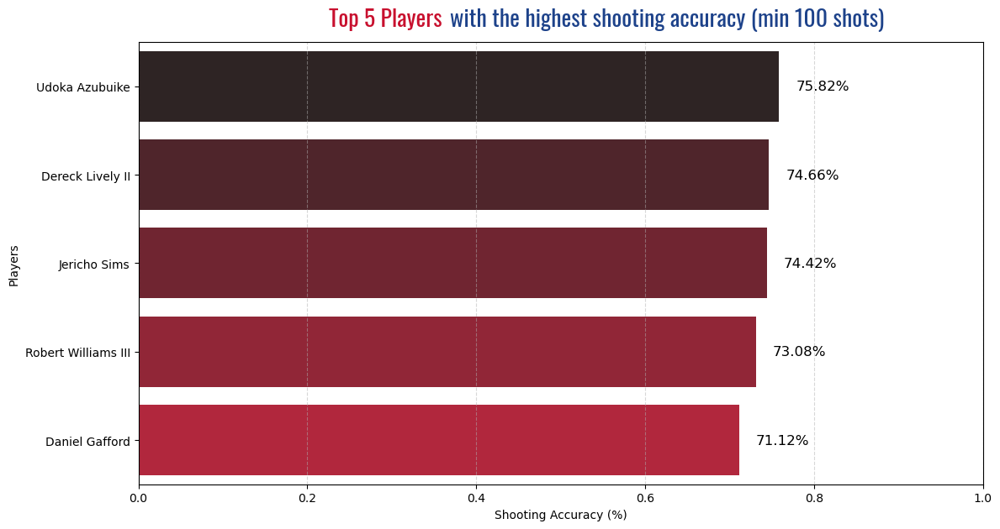

In [87]:

# Cargar fuente Oswald
font_path = "Oswald-VariableFont_wght.ttf"
font_prop = fm.FontProperties(fname=font_path, size=20)

# Agrupar por jugador
player_stats = df.groupby('PLAYER_NAME').agg(
    shots_made=('SHOT_MADE', 'sum'),
    shots_attempted=('SHOT_MADE', 'count')
).reset_index()

# Calcular porcentaje de acierto
player_stats['accuracy'] = player_stats['shots_made'] / player_stats['shots_attempted']

# Filtrar jugadores con al menos 20 tiros
player_stats_filtered = player_stats[player_stats['shots_attempted'] >= 20]

# Tomar top 5 por precisión
top5 = player_stats_filtered.sort_values(by='accuracy', ascending=False).head(5)

# Crear gráfico de barras
plt.figure(figsize=(12, 6))
sns.barplot(data=top5, x='accuracy', y='PLAYER_NAME', hue='PLAYER_NAME', color=colores[0], legend=False)

# Anotar porcentajes de acierto en cada barra
for index, value in enumerate(top5['accuracy']):
    plt.text(value + 0.02, index, f'{value:.2%}', va='center', fontsize=12)

# Título dividido en colores
fig = plt.gcf()
fig.text(0.33, 1.02, "Top 5 Players ", fontproperties=font_prop, color=colores[0], ha='left', va='center')
fig.text(0.45, 1.02, "with the highest shooting accuracy (min 100 shots)", fontproperties=font_prop, color=colores[1], ha='left', va='center')

# Etiquetas de ejes
plt.xlabel('Shooting Accuracy (%)')
plt.ylabel('Players')

# Ajustar diseño
plt.xlim(0, 1)
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()




### ✅ Conclusion:

This analysis reveals which players are most efficient in terms of shooting percentage, regardless of shot volume or shot type. They are strong candidates for key offensive roles, especially in systems where efficiency is prioritized.

### 📊 Comparison of Shooting Accuracy by Team

We will answer this question:

- Which teams have the best shooting percentage?

### ✅ What we will do:

Group the data by team (TEAM_NAME).

Calculate:

- Shots attempted (shots_attempted)

- Shots made (shots_made)

- Shooting percentage (accuracy)

Filter teams with at least 1000 shots (to avoid bias).

Visualize the top 5 in a bar chart.


/tmp/ipykernel_10830/2124066831.py:22: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#C8102E'` for the same effect.

  sns.barplot(data=top5_teams, x='accuracy', y='TEAM_NAME', hue='TEAM_NAME', color = colores[0], legend=False)


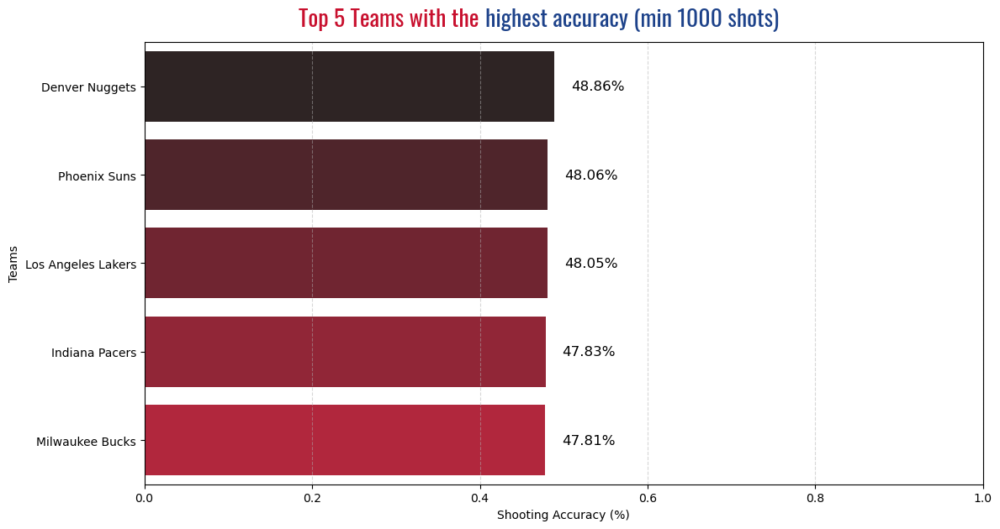

In [94]:

# Cargar fuente Oswald
font_path = "Oswald-VariableFont_wght.ttf"
font_prop = fm.FontProperties(fname=font_path, size=20)

# Agrupar por equipo
team_stats = df.groupby('TEAM_NAME').agg(
    shots_made=('SHOT_MADE', 'sum'),
    shots_attempted=('SHOT_MADE', 'count')
).reset_index()

# Calcular porcentaje de acierto
team_stats['accuracy'] = team_stats['shots_made'] / team_stats['shots_attempted']

# Filtrar equipos con al menos 1000 tiros
team_stats_filtered = team_stats[team_stats['shots_attempted'] >= 1000]

# Tomar top 5 por precisión
top5_teams = team_stats_filtered.sort_values(by='accuracy', ascending=False).head(5)

# Crear gráfico de barras
plt.figure(figsize=(12, 6))
sns.barplot(data=top5_teams, x='accuracy', y='TEAM_NAME', hue='TEAM_NAME', color = colores[0], legend=False)

# Anotar porcentajes de acierto en cada barra
for index, value in enumerate(top5_teams['accuracy']):
    plt.text(value + 0.02, index, f'{value:.2%}', va='center', fontsize=12)

# Título dividido en colores
fig = plt.gcf()
fig.text(0.30, 1.02, "Top 5 Teams with the ", fontproperties=font_prop, color='#C8102E', ha='left', va='center')
fig.text(0.485, 1.02, "highest accuracy (min 1000 shots)", fontproperties=font_prop, color='#1D428A', ha='left', va='center')

# Añadir detalles al gráfico
plt.xlabel('Shooting Accuracy (%)')
plt.ylabel('Teams')

# Ajustar diseño
plt.xlim(0, 1)
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()



### 🔍 Brief Description:

- We evaluate which teams are the most effective at converting their shot attempts.

- Only teams with a significant volume of shots (1000+) are considered.

- The ranking is useful for understanding which franchises are most efficient offensively.

### ✅ Conclusion:

- This chart allows you to identify the most effective teams at shooting, helping to analyze collective strategies and overall offensive efficiency.
- It complements the player performance chart.

### 🎯 Comparison of the 5 Most Accurate Players

We will answer this question:

- Which players are the most accurate when shooting, and from where do they usually take their shots?

### ✅ What we will do:

- Group the data by player (PLAYER_NAME).

- Calculate:

    - Total shots made.

    - Shooting percentage (accuracy).

    - Missed shots percentage.

- Filter players with at least 20 shots to avoid bias.

- Visualize the top 5 players with the best shooting percentage.

- Show their shooting zones (scatter plot over a court image).

- Add key KPIs to each individual chart.

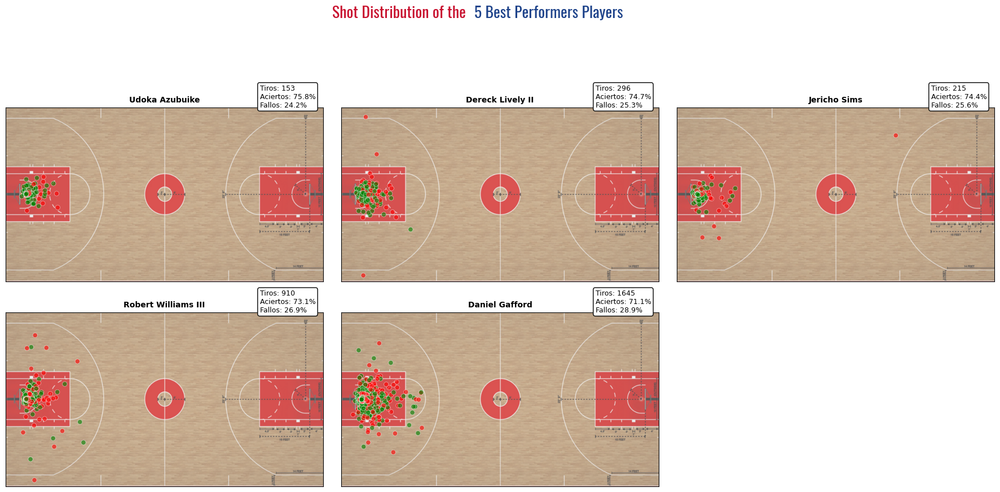

In [103]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm
import matplotlib.image as mpimg

# Cargar fuente Oswald
font_path = "Oswald-VariableFont_wght.ttf"
font_prop = fm.FontProperties(fname=font_path, size=20)

# Tomar top 5 por precisión
top5_players = player_stats_filtered.sort_values(by='accuracy', ascending=False).head(5)['PLAYER_NAME'].tolist()

# Cargar imagen de fondo
img = mpimg.imread('cancha.png')

# Crear subplots (4 filas, 3 columnas)
fig, axes = plt.subplots(4, 3, figsize=(18, 16), sharex=True, sharey=True)
axes = axes.flatten()

for i, player in enumerate(top5_players):
    ax = axes[i]
    player_data = df[df['PLAYER_NAME'] == player]

    # Calcular estadísticas
    total_shots = len(player_data)
    made_shots = player_data['SHOT_MADE'].sum()
    accuracy = made_shots / total_shots
    miss_pct = 1 - accuracy

    # Fondo de cancha
    ax.imshow(img, extent=[0, 90, -25, 25], aspect='auto', alpha=0.7)

    # Scatter plot del jugador
    sns.scatterplot(
        data=player_data,
        y='LOC_X',
        x='LOC_Y',
        hue='SHOT_MADE',
        palette={0: 'red', 1: 'green'},
        ax=ax,
        legend=False,
        alpha=0.6
    )

    # Título y límites
    ax.set_title(player, fontsize=10, fontweight='bold')
    ax.set_xlim(0, 90)
    ax.set_ylim(-25, 25)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.grid(False)

    # Texto con KPIs en la esquina superior izquierda
    ax.text(
        72, 25,  # posición dentro de la cancha
        f"Tiros: {total_shots}\nAciertos: {accuracy:.1%}\nFallos: {miss_pct:.1%}",
        fontsize=9,
        color='black',
        backgroundcolor='white',
        bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3')
    )

# Ocultar subplots sobrantes si hay menos de 12
for j in range(len(top5_players), len(axes)):
    fig.delaxes(axes[j])

# Título general dividido en colores
fig.text(0.33, 1.02, "Shot Distribution of the ", fontproperties=font_prop, color='#C8102E', ha='left', va='center')
fig.text(0.47, 1.02, "5 Best Performers Players", fontproperties=font_prop, color='#1D428A', ha='left', va='center')

# Ajustar diseño
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()



### 🔍 Brief Description:

The location of attempted and successful shots for each of the 5 most effective players is visualized.

Successful shots appear in green, and missed shots in red.

Each chart includes:

- Total number of shots.

- Shooting percentage.



### ✅ Conclusion:

- Efficiency in the restricted area: All players show a higher concentration of shots near the basket, where shooting percentages are traditionally higher.

- Player profile: The 5 are primarily big men (centers/power forwards) who operate near the basket, which explains their high shooting percentages.

- Volume-accuracy relationship: An inverse correlation is observed between shot volume and shooting percentage (e.g., Williams with 930 shots and 73.1% vs Gafford with 1645 shots and 71.1%).

- Spatial patterns: The graphs reveal that these players avoid low-percentage areas like the perimeter, focusing on high-performance zones.

- Game strategy: These data confirm that teams optimize their offense by assigning shots close to the basket to their most effective players in those areas.


In [106]:
# Agrupar por jugador
player_stats = df.groupby('PLAYER_NAME').agg(
    shots_made=('SHOT_MADE', 'sum'),
    shots_attempted=('SHOT_MADE', 'count')
).reset_index()

# Calcular precisión y fallos
player_stats['accuracy'] = player_stats['shots_made'] / player_stats['shots_attempted']
player_stats['missed_shots'] = player_stats['shots_attempted'] - player_stats['shots_made']
player_stats['miss_pct'] = 1 - player_stats['accuracy']

# Filtrar jugadores con al menos 100 tiros (ajustable)
player_stats_filtered = player_stats[player_stats['shots_attempted'] >= 100]

# Tomar top 5 jugadores más precisos
player_kpi_top5 = player_stats_filtered.sort_values(by='accuracy', ascending=False).head(5)

# Formatear columnas como porcentaje
player_kpi_top5['accuracy'] = player_kpi_top5['accuracy'].apply(lambda x: f"{x:.2%}")
player_kpi_top5['miss_pct'] = player_kpi_top5['miss_pct'].apply(lambda x: f"{x:.2%}")

# Reordenar y renombrar columnas
player_kpi_top5 = player_kpi_top5[[
    'PLAYER_NAME', 'shots_attempted', 'shots_made', 'missed_shots', 'accuracy', 'miss_pct'
]]
player_kpi_top5.columns = [
    'Player', 'Shot Tried', 'Made Shot', 'Missed shot', 'Accuracy', 'Missed %'
]

# Mostrar tabla tipo KPI
print("Top 5 players with the best shooting accuracy:")
print(player_kpi_top5.to_string(index=False))


Top 5 players with the best shooting accuracy:
             Player  Shot Tried  Made Shot  Missed shot Accuracy Missed %
     Udoka Azubuike         153        116           37   75.82%   24.18%
   Dereck Lively II         296        221           75   74.66%   25.34%
       Jericho Sims         215        160           55   74.42%   25.58%
Robert Williams III         910        665          245   73.08%   26.92%
     Daniel Gafford        1645       1170          475   71.12%   28.88%


In [56]:
# Obtener posiciones únicas de los top 5 jugadores

top5_positions = df[df['PLAYER_NAME'].isin(top5_players)][['PLAYER_NAME', 'POSITION_GROUP']].drop_duplicates()

print(top5_positions)


                PLAYER_NAME POSITION_GROUP
33           Daniel Gafford              C
37124   Robert Williams III              C
45049        Udoka Azubuike              C
73858          Jericho Sims              C
167432     Dereck Lively II              C
436226         Jericho Sims              F
653564       Daniel Gafford              F


In [109]:
# Filtrar datos para los jugadores top5
top5_data = df[df['PLAYER_NAME'].isin(top5_players)]

# Agrupar por jugador y calcular:
# - Total de aciertos
# - Acción más común
top5_summary = top5_data[top5_data['SHOT_MADE'] == 1].groupby('PLAYER_NAME').agg(
    total_made=('SHOT_MADE', 'count'),
    most_common_action=('ACTION_TYPE', lambda x: x.mode().iloc[0] if not x.mode().empty else 'Desconocido')
)

print(top5_summary)


                     total_made   most_common_action
PLAYER_NAME                                         
Daniel Gafford             1170  Alley Oop Dunk Shot
Dereck Lively II            221  Alley Oop Dunk Shot
Jericho Sims                160  Alley Oop Dunk Shot
Robert Williams III         665  Alley Oop Dunk Shot
Udoka Azubuike              116            Dunk Shot


### 🏀 Types of Dunks in Basketball

##### Dunk Shot → Dunk:
➡️ This occurs when a player jumps and scores the ball directly into the basket with one or both hands.

##### Alley Oop Dunk Shot → Alley-Oop Dunk:
➡️ This play involves a player throwing the ball near the rim, and a teammate catches it mid-air to perform a dunk without the ball touching the ground.

### 📊 Analysis of Most Accurate Players

- Shooting Zones: The most accurate players tend to make most of their shots near the basket, in the paint, although some are also effective from mid-range.

- Types of Shots: Dunks (dunk shots) and alley-oops dominate, along with jump shots and some fadeaways. Three-point shots are very rare.

- Play Style: They excel with high efficiency near the basket and in fast plays. Their accuracy is higher on close shots than on long-distance shots.


## 📈 Identification of Patterns, Trends, and Anomalies
### ✅ Patterns Found:

- Centers and interior players ('POSITION' = C, F..) have the highest shooting percentages, generally because they shoot close to the basket.

- Teams with efficient team play (Denver Nuggets, Suns) show high collective accuracy.

- Areas like under the basket (the paint) are the most effective overall.

### 🚩 Observed Anomalies:

- Some players with few attempts showed high accuracy (bias due to low volume).

- Teams with high shooting volume do not always have high accuracy (e.g., Lakers vs Nuggets).

- Long-distance shots (three-point range) have a low percentage despite their frequency.


### 🔍 Graph Description

- The graph spatially compares where the 5 most accurate teams shoot and score.

- It reveals shooting patterns:

    - Whether they shoot closer to the basket.

    - Whether they distribute their shots evenly.

    - Whether misses are concentrated in certain areas.

- It also highlights relative efficiency:

    - Teams that shoot less but have high accuracy.

    - Teams that shoot a lot with high precision.


### 🏀 Comparison of the 5 Most Accurate Teams

We are going to answer this question:

- Which teams are the most accurate and where do they usually shoot from?

### ✅ What will we do?

- Group the data by team (TEAM_NAME).

- Calculate:

    - Total shots attempted.

    - Accuracy percentage.

    - Miss percentage.

- Filter teams with at least 100 shots to avoid bias from low volume.

- Visualize the top 5 teams with the highest accuracy percentage.

- Show their shooting zones (scatter plot over court image).

- Add key KPIs in each individual graph.



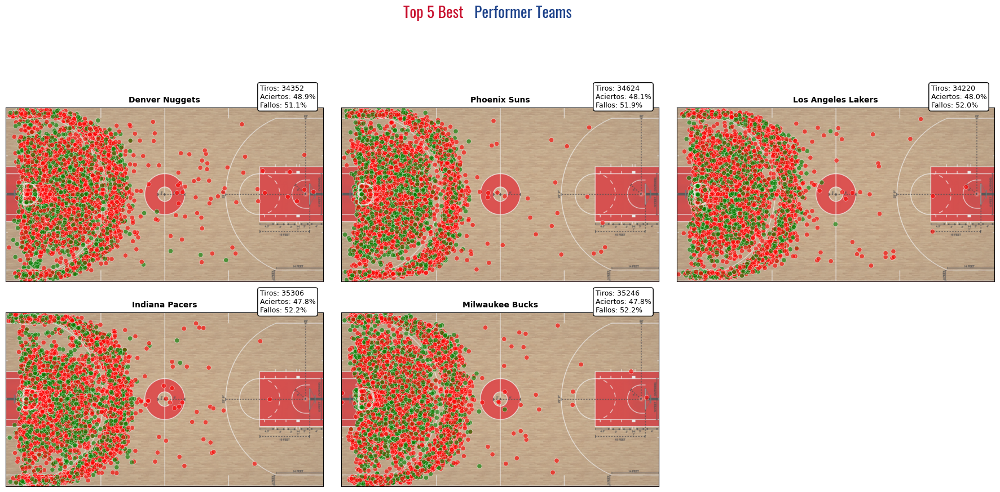

In [114]:

# Cargar fuente Oswald
font_path = "Oswald-VariableFont_wght.ttf"
font_prop = fm.FontProperties(fname=font_path, size=20)

# Agrupar por equipo
team_stats = df.groupby('TEAM_NAME').agg(
    shots_made=('SHOT_MADE', 'sum'),
    shots_attempted=('SHOT_MADE', 'count')
).reset_index()

# Calcular porcentaje de acierto
team_stats['accuracy'] = team_stats['shots_made'] / team_stats['shots_attempted']

# Filtrar equipos con al menos 100 tiros (puedes ajustar este umbral)
team_stats_filtered = team_stats[team_stats['shots_attempted'] >= 100]

# Ordenar y tomar top 5
top5_teams = team_stats_filtered.sort_values(by='accuracy', ascending=False).head(5)['TEAM_NAME'].tolist()

# Cargar imagen de fondo
img = mpimg.imread('cancha.png')

# Crear subplots (4 filas, 3 columnas)
fig, axes = plt.subplots(4, 3, figsize=(18, 16), sharex=True, sharey=True)
axes = axes.flatten()

for i, team in enumerate(top5_teams):
    ax = axes[i]
    team_data = df[df['TEAM_NAME'] == team]

    # Calcular estadísticas
    total_shots = len(team_data)
    made_shots = team_data['SHOT_MADE'].sum()
    accuracy = made_shots / total_shots
    miss_pct = 1 - accuracy

    # Fondo de cancha
    ax.imshow(img, extent=[0, 90, -25, 25], aspect='auto', alpha=0.7)

    # Scatter plot del equipo
    sns.scatterplot(
        data=team_data,
        y='LOC_X',
        x='LOC_Y',
        hue='SHOT_MADE',
        palette={0: 'red', 1: 'green'},
        ax=ax,
        legend=False,
        alpha=0.6
    )

    # Título y límites
    ax.set_title(team, fontsize=10, fontweight='bold')
    ax.set_xlim(0, 90)
    ax.set_ylim(-25, 25)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.grid(False)

    # Texto con KPIs en la esquina superior izquierda
    ax.text(
        72, 25,  # posición dentro del gráfico
        f"Tiros: {total_shots}\nAciertos: {accuracy:.1%}\nFallos: {miss_pct:.1%}",
        fontsize=9,
        color='black',
        backgroundcolor='white',
        bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3')
    )

# Ocultar subplots sobrantes si hay menos de 12
for j in range(len(top5_teams), len(axes)):
    fig.delaxes(axes[j])

# Título general dividido en colores
fig.text(0.40, 1.02, "Top 5 Best ", fontproperties=font_prop, color='#C8102E', ha='left', va='center')
fig.text(0.47, 1.02, "Performer Teams", fontproperties=font_prop, color='#1D428A', ha='left', va='center')

# Ajustar diseño
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()



### 🔍 Brief Description

The location of the attempted and successful shots for each of the 5 most accurate teams is visualized.

Successful shots are shown in green, and missed shots in red.

Each graph includes:

- Total number of shots.

- Accuracy percentage.

- Miss percentage.

### ✅ Conclusion

- This graph helps identify which teams are most efficient at shooting and from which zones they achieve it.

- By including the total shot volume, it avoids highlighting teams with few attempts and potential biases.

- It is a valuable tool for both tactical analysis and opponent scouting.

- Complements the individual analysis (players), offering an aggregated perspective of offensive effectiveness by team.


In [115]:
# Crear tabla KPI para equipos
team_kpi = team_stats_filtered.copy()

team_kpi['missed_shots'] = team_kpi['shots_attempted'] - team_kpi['shots_made']
team_kpi['miss_pct'] = 1 - team_kpi['accuracy']

# Elegimos el top 5 más precisos
team_kpi_top5 = team_kpi.sort_values(by='accuracy', ascending=False).head(5)

# Formatear como porcentajes
team_kpi_top5['accuracy'] = team_kpi_top5['accuracy'].apply(lambda x: f"{x:.2%}")
team_kpi_top5['miss_pct'] = team_kpi_top5['miss_pct'].apply(lambda x: f"{x:.2%}")

# Reordenar columnas para visual tipo KPI
team_kpi_top5 = team_kpi_top5[['TEAM_NAME', 'shots_attempted', 'shots_made', 'missed_shots', 'accuracy', 'miss_pct']]
team_kpi_top5.columns = ['Team', 'Shots tried', 'Made shots', 'Missed shots', 'Accuracy', 'Miss %']

print(team_kpi_top5.to_string(index=False))


              Team  Shots tried  Made shots  Missed shots Accuracy Miss %
    Denver Nuggets        34352       16783         17569   48.86% 51.14%
      Phoenix Suns        34624       16640         17984   48.06% 51.94%
Los Angeles Lakers        34220       16442         17778   48.05% 51.95%
    Indiana Pacers        35306       16887         18419   47.83% 52.17%
   Milwaukee Bucks        35246       16852         18394   47.81% 52.19%


### Comparison of the 5 Most Accurate Players and Teams

When comparing the top 5 players with the top 5 teams, a strong correlation in their performance is observed:

- **Accuracy and Consistency:** The players with the highest accuracy align with the most effective teams, reflecting the connection between individual and collective performance.

- **Strategic Shot Zones:** Both groups excel at selecting more effective shooting zones, resulting in higher shooting percentages.

- **Collective vs. Individual Play:** Key players in the most accurate teams exhibit patterns similar to those of the best individual players, showing that individual efficiency translates into better results for the team.

In summary, both the most accurate players and the most effective teams stand out for their shooting strategy, consistency, and decision-making on the court.


## TOP 5 PLAYERS with the most total shots made


In [60]:
# Agrupar por jugador y equipo, y contar el total de tiros acertados
top_players = df.groupby(['PLAYER_NAME', 'TEAM_NAME'])['SHOT_MADE'].sum().reset_index()

# Ordenar por la columna 'SHOT_MADE' de forma descendente
top_players = top_players.sort_values(by='SHOT_MADE', ascending=False)

# Seleccionar los 5 jugadores con más tiros acertados
top_5_players = top_players.head(5)

# Mostrar el resultado
print(top_5_players)


                PLAYER_NAME         TEAM_NAME  SHOT_MADE
624   Giannis Antetokounmpo   Milwaukee Bucks       3544
1402           Nikola Jokic    Denver Nuggets       3529
1195            Luka Doncic  Dallas Mavericks       3392
858            Jayson Tatum    Boston Celtics       3264
462            Devin Booker      Phoenix Suns       3081


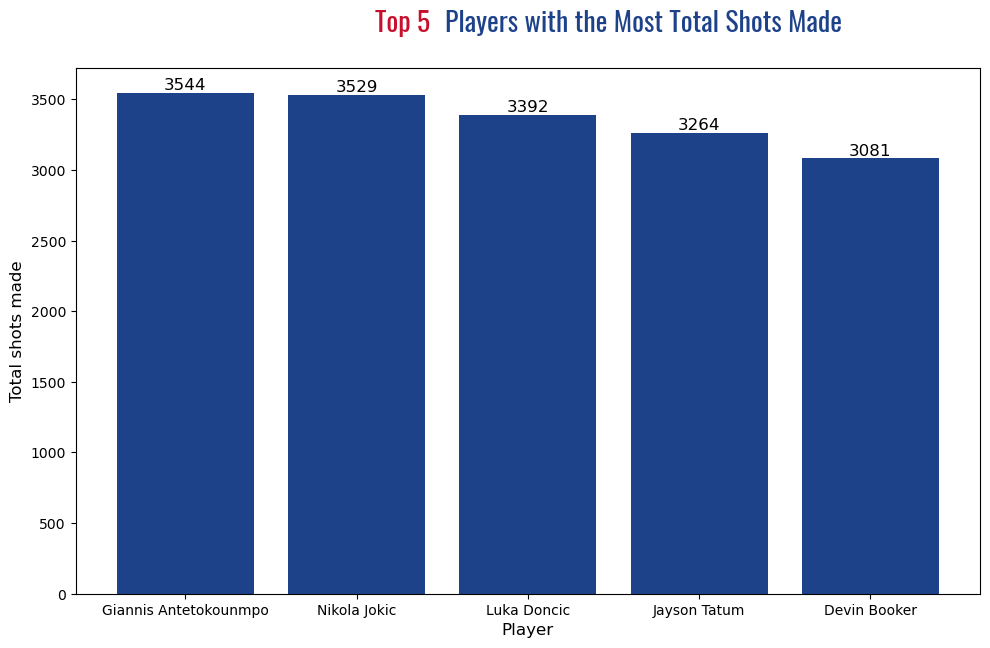

In [128]:
# Cargar fuente Oswald
font_path = "/home/reboot-student/code/labs/Projects/DB-NBA/Oswald-VariableFont_wght.ttf"
font_prop = fm.FontProperties(fname=font_path, size=20)

# Agrupar por jugador y equipo, y contar el total de tiros acertados
top_players = df.groupby(['PLAYER_NAME', 'TEAM_NAME'])['SHOT_MADE'].sum().reset_index()

# Ordenar por la columna 'SHOT_MADE' de forma descendente
top_players = top_players.sort_values(by='SHOT_MADE', ascending=False)

# Seleccionar los 5 jugadores con más tiros acertados
top_5_players = top_players.head(5)

# Crear un gráfico de barras
plt.figure(figsize=(10, 6))
plt.bar(top_5_players['PLAYER_NAME'], top_5_players['SHOT_MADE'], color=colores[1])

# Añadir título dividido en dos colores
fig = plt.gcf()
fig.text(0.38, 1.05, "Top 5 ", fontproperties=font_prop, color='#C8102E', ha='left', va='center')
fig.text(0.45, 1.05, "Players with the Most Total Shots Made", fontproperties=font_prop, color='#1D428A', ha='left', va='center')

# Etiquetas y detalles
plt.xlabel('Player', fontsize=12)
plt.ylabel('Total shots made', fontsize=12)

# Añadir las etiquetas sobre las barras para mostrar los valores
for index, value in enumerate(top_5_players['SHOT_MADE']):
    plt.text(index, value + 2, str(value), ha='center', va='bottom', fontsize=12)

# Ajustar diseño
plt.tight_layout()
plt.show()


### Description

1. The chart and results display the top 5 players with the most successful shots, based on their total makes. Players are grouped by name and team, and sorted by the number of successful shots.

2. The bar chart visualizes the total successful shots for each player, allowing for a comparison of their effectiveness.

### Conclusion

- Players with the most successful shots demonstrate a high level of consistency and performance.

- This analysis is valuable for identifying standout players, which can be useful for offensive strategies as well as evaluating individual contributions to the team.


## TOP 5 EQUIPOS con mas aciertos en total

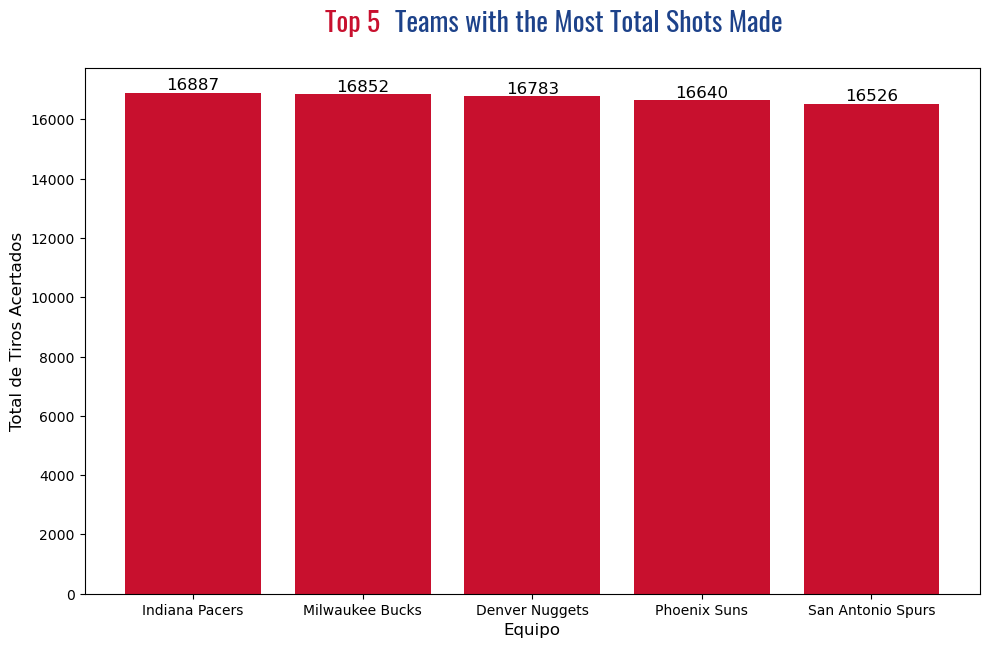

            TEAM_NAME  SHOT_MADE
11     Indiana Pacers      16887
16    Milwaukee Bucks      16852
7      Denver Nuggets      16783
23       Phoenix Suns      16640
26  San Antonio Spurs      16526


In [127]:
# Cargar fuente Oswald
font_path = "Oswald-VariableFont_wght.ttf"
font_prop = fm.FontProperties(fname=font_path, size=20)

# Agrupar por equipo y sumar los tiros acertados
top_teams = df.groupby('TEAM_NAME')['SHOT_MADE'].sum().reset_index()

# Ordenar por la columna 'SHOT_MADE' de forma descendente
top_teams = top_teams.sort_values(by='SHOT_MADE', ascending=False)

# Seleccionar los equipos con mayor número de aciertos (los 5 primeros)
top_5_teams = top_teams.head(5)

# Crear gráfico de barras
plt.figure(figsize=(10, 6))
plt.bar(top_5_teams['TEAM_NAME'], top_5_teams['SHOT_MADE'], color=colores[0])

# Añadir título dividido en dos colores
fig = plt.gcf()
fig.text(0.33, 1.05, "Top 5 ", fontproperties=font_prop, color='#C8102E', ha='left', va='center')
fig.text(0.4, 1.05, "Teams with the Most Total Shots Made", fontproperties=font_prop, color='#1D428A', ha='left', va='center')

# Etiquetas y detalles
plt.xlabel('Equipo', fontsize=12)
plt.ylabel('Total de Tiros Acertados', fontsize=12)

# Añadir las etiquetas sobre las barras para mostrar los valores
for index, value in enumerate(top_5_teams['SHOT_MADE']):
    plt.text(index, value + 2, str(value), ha='center', va='bottom', fontsize=12)

# Ajustar diseño
plt.tight_layout()
plt.show()

# Mostrar el resultado de top_5_teams
print(top_5_teams)



### Description

1. **Table of Teams with Most Successful Shots:**

- The data was grouped by team, and then the total successful shots for each team were summed.

- After sorting the teams by total successful shots in descending order, the top 5 teams with the most successful shots were selected.

The result shows a table with the team names and total successful shots, helping to identify the most effective teams.

2. **Bar Chart of Teams with Most Successful Shots:**

- The bar chart visually presents the top 5 teams with the most successful shots.

- The bars are sorted from lowest to highest, and each bar is labeled with the number of successful shots.

- The Y-axis is adjusted to focus on smaller differences, providing a more precise comparison between the teams.

This chart makes it easier to visualize the offensive effectiveness of the top teams.

### Conclusion

- **Most Effective Teams:** The top five teams with the highest successful shots stand out for their offensive precision.

- The visualization highlights the small differences between teams, which could be crucial for analyzing team performance.

- This analysis is useful for both individual offensive strategies and comparative team evaluations.

